# Download

https://mapreader.readthedocs.io/en/latest/User-guide/Download.html

In [1]:
from mapreader import SheetDownloader

my_ts = SheetDownloader(
    metadata_path="../NLS_metadata/metadata_OS_One_Inch_GB_WFS_light.json",
    download_url="https://geo.nls.uk/maps/os/1inch_2nd_ed/{z}/{x}/{y}.png",
)

[INFO] Metadata file has 480 item(s).


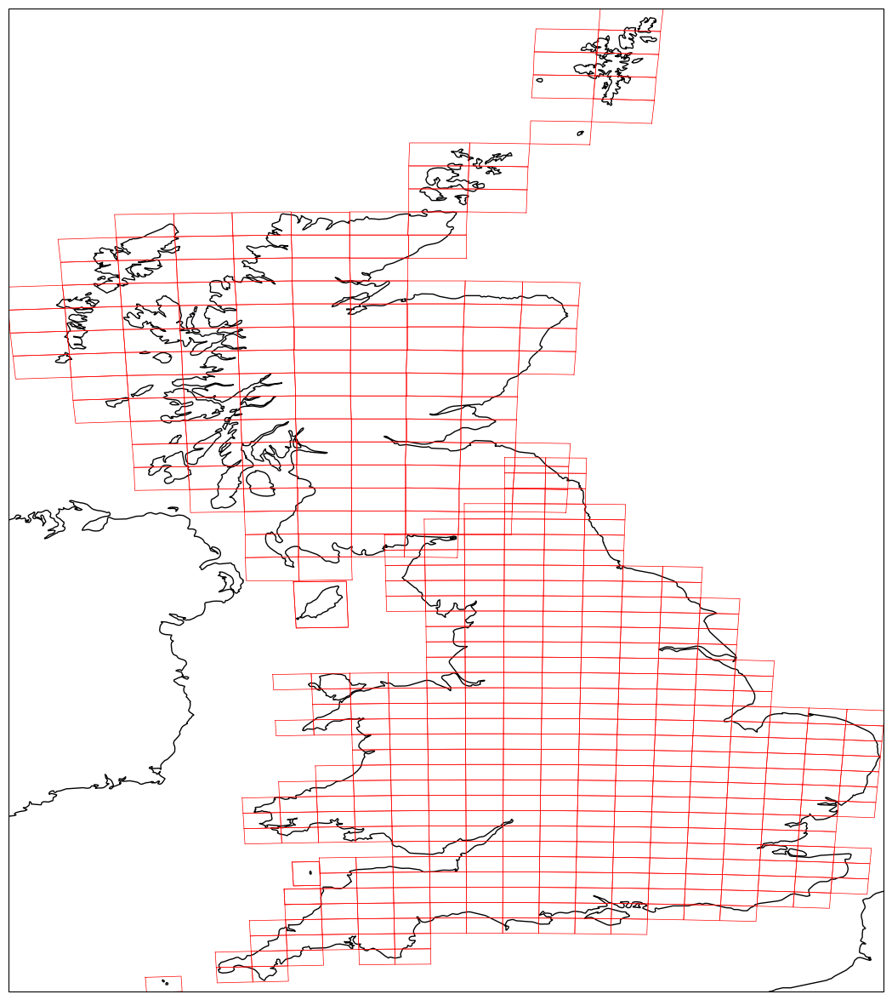

In [2]:
my_ts.extract_wfs_id_nos()
my_ts.plot_all_metadata_on_map(map_extent="uk", add_id=False)

In [6]:
my_ts.get_minmax_latlon()

[INFO] Min lat: 49.82091681, max lat: 60.97000003 
[INFO] Min lon: -8.11999993, max lon: 1.83188116


1873 1909 36


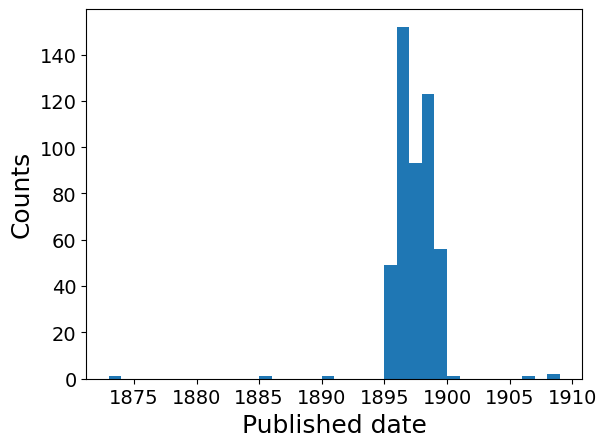

In [7]:
my_ts.extract_published_dates()
my_ts.hist_published_dates()


## Query maps using a list of lats/lons

In [9]:
my_ts.query_map_sheets_by_coordinates((-4.33, 55.90))
my_ts.query_map_sheets_by_coordinates((-3.25, 51.93), append=True)

In [10]:
my_ts.print_found_queries()

Query results:
URL:     	https://maps.nls.uk/view/74488689
coordinates (bounds):  	(-4.82999994, 55.79000003, -4.20999993, 56.05000003)
--------------------
URL:     	https://maps.nls.uk/view/101168342
coordinates (bounds):  	(-3.33544762, 51.87891401, -2.91228731, 52.05404182)
--------------------


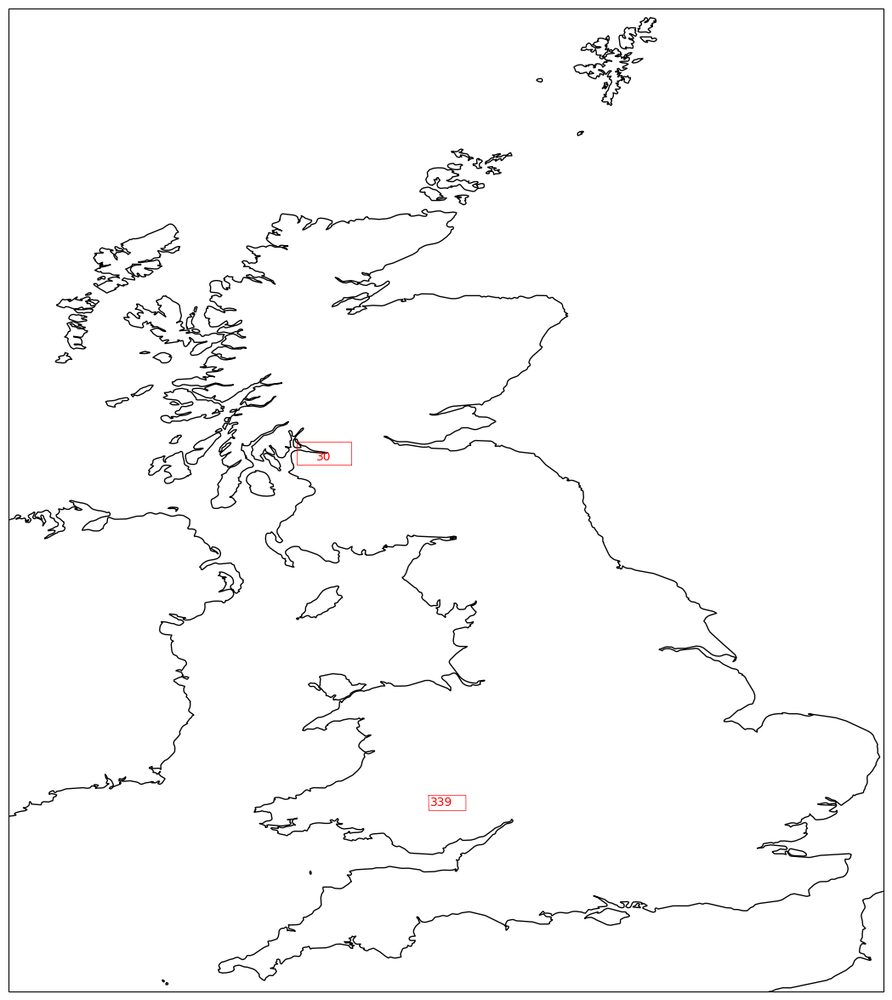

In [11]:
my_ts.plot_queries_on_map(map_extent="uk")

## Download map tiles

In [12]:
my_ts.get_grid_bb(zoom_level=14)
my_ts.download_map_sheets_by_queries(overwrite=True)

  0%|          | 0/2 [00:00<?, ?it/s]

[INFO] Downloaded "map_74488689.png"
[INFO] Downloaded "map_101168342.png"


# Load

https://mapreader.readthedocs.io/en/latest/User-guide/Load.html

## Load in downloaded maps

In [13]:
from mapreader import loader

In [14]:
my_files = loader("./maps/*png")

  0%|          | 0/2 [00:00<?, ?it/s]

In [15]:
# len() shows the total number of images currently read (or sliced, see below)
print(f"Number of images: {len(my_files)}")

Number of images: 2


In [16]:
print(my_files)

#images: 2

#parents: 2
map_74488689.png
map_101168342.png

#patches: 0



In [17]:
my_files.add_metadata("./maps/metadata.csv")

In [18]:
parent_list = my_files.list_parents()

  0%|          | 0/1 [00:00<?, ?it/s]

[<Figure size 2000x2000 with 1 Axes>]

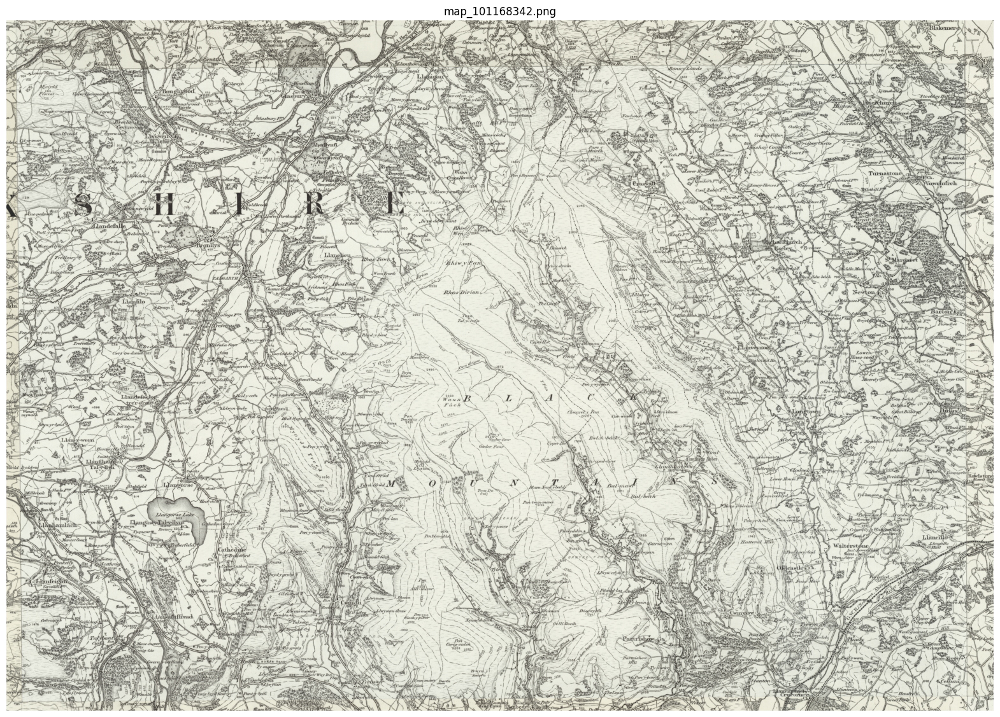

In [19]:
my_files.show(parent_list[1], figsize=(20, 20))

## Patchify maps

In [20]:
my_files.patchify_all(patch_size=100)  # in pixels

[INFO] Saving patches in directory named "patches_100_pixel".


  0%|          | 0/2 [00:00<?, ?it/s]

maps/map_74488689.png
maps/map_101168342.png


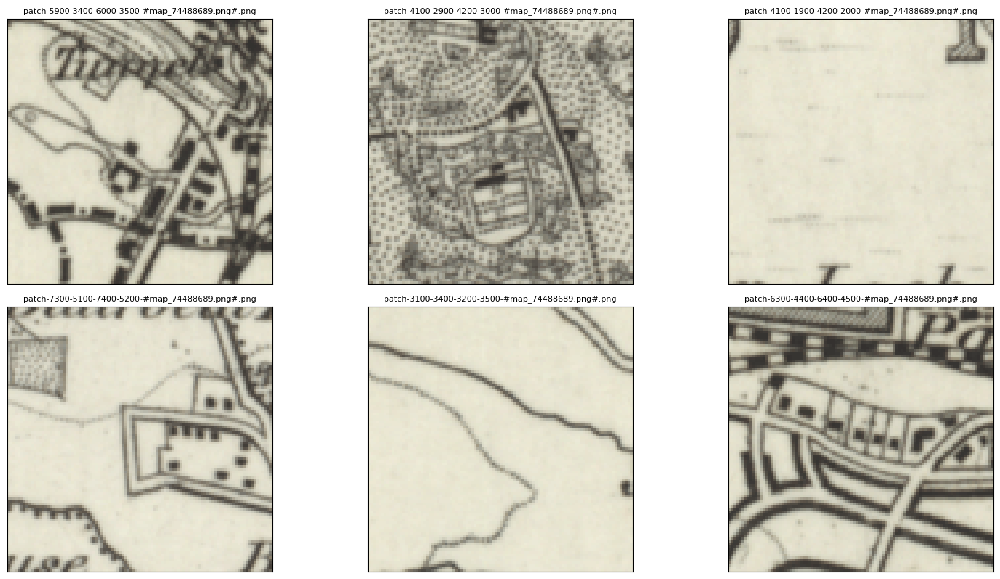

In [21]:
my_files.show_sample(num_samples=6, tree_level="patch")

100%|█████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.45s/it]


[<Figure size 1500x1500 with 1 Axes>]

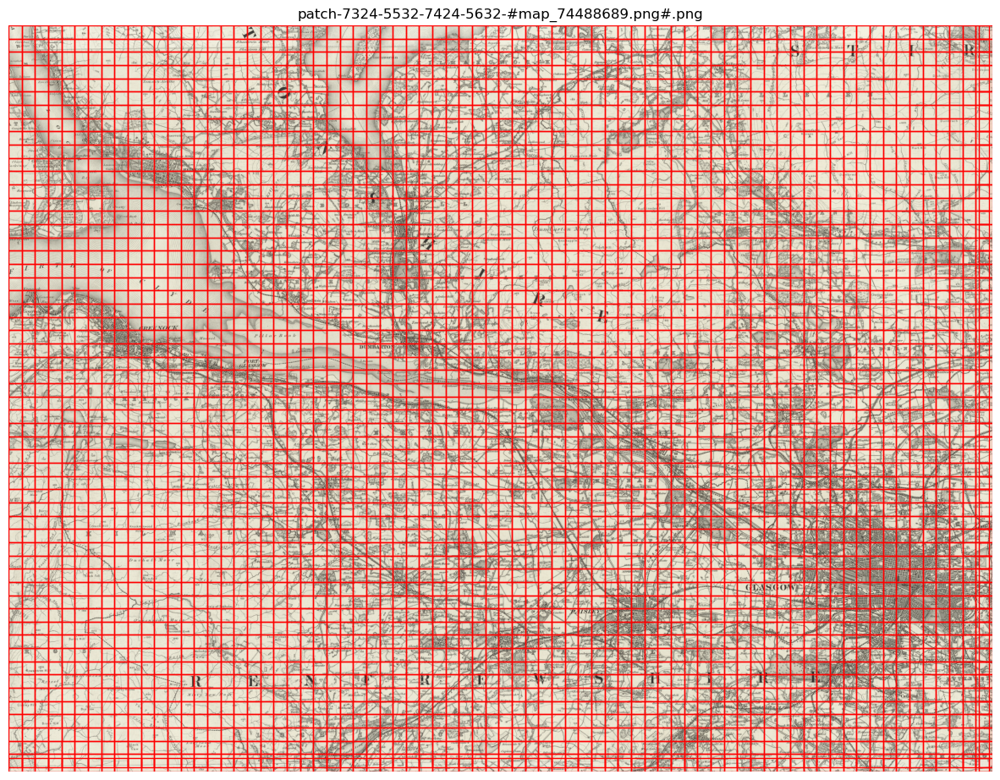

In [19]:
my_files.show_parent(
    parent_list[0], patch_border=True, plot_parent=True, figsize=(15, 15)
)

## Calculate pixel intensities

In [22]:
my_files.calc_pixel_stats()

  0%|          | 0/2 [00:00<?, ?it/s]

In [23]:
parent_df, patch_df = my_files.convert_images(save=True)

[INFO] Saved parent dataframe as "parent_df.csv"
[INFO] Saved patch dataframe as "patch_df.csv"


In [24]:
parent_df.head()

,parent_id,image_path,shape,name,url,coordinates,crs,published_date,grid_bb,patches,dlon,dlat
image_id,,,,,,,,,,,,
map_74488689.png,None,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(5632, 7424, 4)",map_74488689.png,https://maps.nls.uk/view/74488689,"(-4.833984375, 55.78892895389263, -4.196777343...",EPSG:4326,1898,"[(14, 7972, 5097)x(14, 8000, 5118)]","[patch-0-0-100-100-#map_74488689.png#.png, pat...",0.000086,0.000048
map_101168342.png,None,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(3584, 5120, 4)",map_101168342.png,https://maps.nls.uk/view/101168342,"(-3.33984375, 51.87649097061476, -2.900390625,...",EPSG:4326,1896,"[(14, 8040, 5407)x(14, 8059, 5420)]","[patch-0-0-100-100-#map_101168342.png#.png, pa...",0.000086,0.000053


In [25]:
patch_df.head()

,parent_id,image_path,shape,pixel_bounds,coordinates,crs,polygon,mean_pixel_R,mean_pixel_G,mean_pixel_B,mean_pixel_A,std_pixel_R,std_pixel_G,std_pixel_B,std_pixel_A
image_id,,,,,,,,,,,,,,,
patch-0-0-100-100-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(100, 100, 4)","(0, 0, 100, 100)","(-4.833984375, 56.0549605209174, -4.8254013061...",EPSG:4326,"POLYGON ((-4.825401306152344 56.0549605209174,...",0.882480,0.875822,0.814781,1.000000,0.092767,0.095471,0.091923,0.000000
patch-0-100-100-200-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(100, 100, 4)","(0, 100, 100, 200)","(-4.833984375, 56.050151562728225, -4.82540130...",EPSG:4326,POLYGON ((-4.825401306152344 56.05015156272822...,0.844518,0.836567,0.775709,0.999144,0.122864,0.126680,0.121811,0.020511
patch-0-200-100-300-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(100, 100, 4)","(0, 200, 100, 300)","(-4.833984375, 56.04534260453906, -4.825401306...",EPSG:4326,POLYGON ((-4.825401306152344 56.04534260453906...,0.795914,0.784561,0.719604,1.000000,0.104913,0.107458,0.103096,0.000000
patch-0-300-100-400-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(100, 100, 4)","(0, 300, 100, 400)","(-4.833984375, 56.04053364634989, -4.825401306...",EPSG:4326,POLYGON ((-4.825401306152344 56.04053364634989...,0.736126,0.723507,0.660471,1.000000,0.132483,0.136058,0.130438,0.000000
patch-0-400-100-500-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(100, 100, 4)","(0, 400, 100, 500)","(-4.833984375, 56.03572468816073, -4.825401306...",EPSG:4326,POLYGON ((-4.825401306152344 56.03572468816073...,0.783474,0.770846,0.705413,1.000000,0.127172,0.129634,0.123469,0.000000


In [26]:
patch_df.mean()

mean_pixel_R    0.778379
mean_pixel_G    0.770237
mean_pixel_B    0.710277
mean_pixel_A    0.978684
std_pixel_R     0.155697
std_pixel_G     0.158047
std_pixel_B     0.149171
std_pixel_A     0.015657
dtype: float64

  0%|          | 0/1 [00:00<?, ?it/s]

[<Figure size 2000x2000 with 2 Axes>]

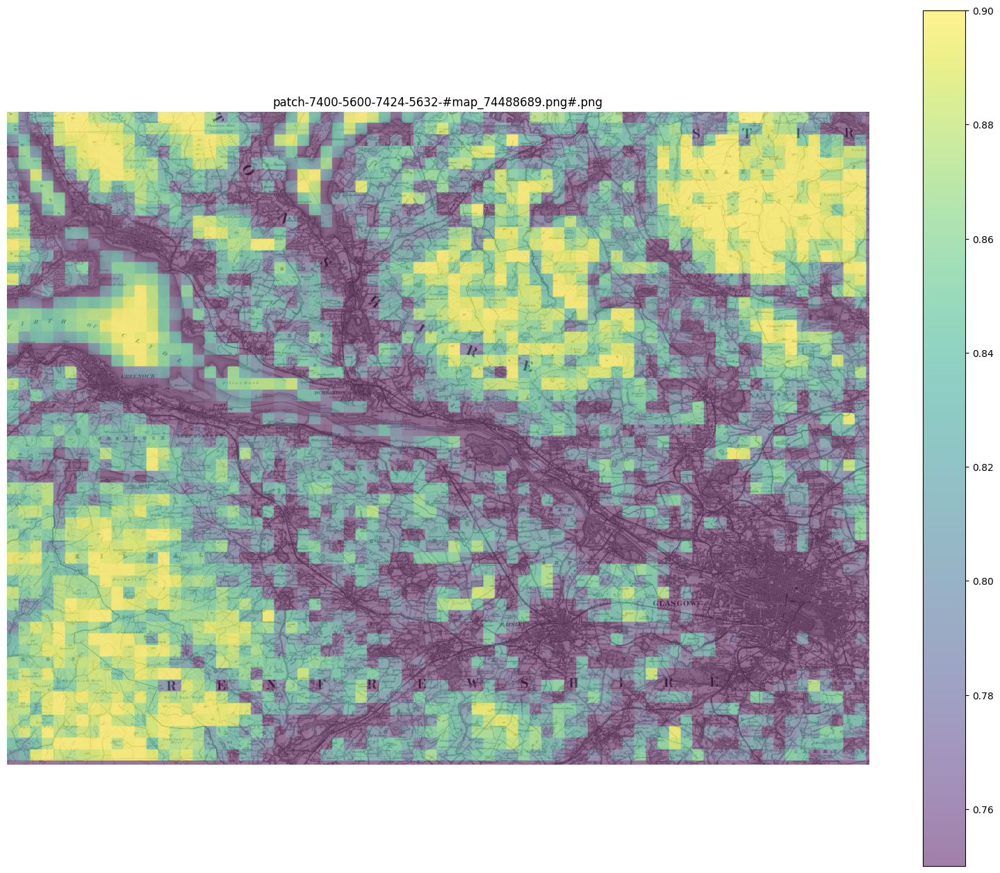

In [27]:
my_files.show_parent(
    parent_list[0],
    column_to_plot="mean_pixel_R",
    patch_border=False,
    plot_parent=True,
    vmin=0.75,
    vmax=0.9,
    figsize=(20, 20),
    alpha=0.5,
)

# Annotate
https://mapreader.readthedocs.io/en/latest/User-guide/Annotate.html

## Set up inputs

In [28]:
from mapreader import Annotator

In [48]:
userID = "rw"
annotation_tasks_file = "./annotation_tasks.yaml"
task = "railspace"
annotation_set = "task_test_one_inch_maps_001"

# sortby="mean" sorts the patches according to the mean pixel intensities
# xoffset and yoffset specify the border size around a patch to be used as the context image (in pixel)
annotator = Annotator(
    "./patch_df.csv",
    "./parent_df.csv",
    labels = ["no", "railspace"],
    annotations_dir="./annotations_one_inch",
    show_context=True,
    username="rosie",
)

## Annotate maps and save annotations

In [100]:
annotator.annotate()

[INFO] Filtering for: {}


Output(layout=Layout(align_items='center', display='flex', flex_flow='column'))

# Train
https://mapreader.readthedocs.io/en/latest/User-guide/Classify.html

## Read annotations

In [101]:
from mapreader import AnnotationsLoader

In [102]:
annotated_images = AnnotationsLoader()

annotated_images.load("./annotations_one_inch/task_#rosie#-ba037c6f549545b27ca29e3e21d7863b.csv")

[INFO] Reading "./annotations_one_inch/task_#rosie#-ba037c6f549545b27ca29e3e21d7863b.csv"
[INFO] Number of annotations:   241

[INFO] Number of instances of each label (from column "label"):
    - no:  205
    - railspace:  36



In [103]:
annotated_images.annotations

,parent_id,image_path,shape,pixel_bounds,coordinates,crs,polygon,mean_pixel_R,mean_pixel_G,mean_pixel_B,...,std_pixel_G,std_pixel_B,std_pixel_A,url,label,min_x,min_y,max_x,max_y,label_index
image_id,,,,,,,,,,,,,,,,,,,,,
patch-0-2800-100-2900-#map_101168342.png#.png,map_101168342.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(100, 100, 4)","(0, 2800, 100, 2900)","(-3.33984375, 51.91265848442559, -3.3312606811...",EPSG:4326,POLYGON ((-3.3312606811523438 51.9126584844255...,0.827839,0.821540,0.760380,...,0.160798,0.151926,0.014582,https://maps.nls.uk/view/101168342,no,0,2800,100,2900,0
patch-100-100-200-200-#map_101168342.png#.png,map_101168342.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(100, 100, 4)","(100, 100, 200, 200)","(-3.3312606811523438, 52.05542498631044, -3.32...",EPSG:4326,POLYGON ((-3.3226776123046875 52.0554249863104...,0.665685,0.661680,0.613729,...,0.210115,0.199086,0.000192,https://maps.nls.uk/view/101168342,no,100,100,200,200,0
patch-100-1700-200-1800-#map_101168342.png#.png,map_101168342.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(100, 100, 4)","(100, 1700, 200, 1800)","(-3.3312606811523438, 51.97082261482312, -3.32...",EPSG:4326,POLYGON ((-3.3226776123046875 51.9708226148231...,0.797222,0.800320,0.760273,...,0.189130,0.183528,0.000000,https://maps.nls.uk/view/101168342,no,100,1700,200,1800,0
patch-100-2800-200-2900-#map_101168342.png#.png,map_101168342.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(100, 100, 4)","(100, 2800, 200, 2900)","(-3.3312606811523438, 51.91265848442559, -3.32...",EPSG:4326,POLYGON ((-3.3226776123046875 51.9126584844255...,0.772582,0.774909,0.735118,...,0.198136,0.192843,0.000266,https://maps.nls.uk/view/101168342,no,100,2800,200,2900,0
patch-200-1700-300-1800-#map_101168342.png#.png,map_101168342.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(100, 100, 4)","(200, 1700, 300, 1800)","(-3.3226776123046875, 51.97082261482312, -3.31...",EPSG:4326,POLYGON ((-3.3140945434570312 51.9708226148231...,0.819326,0.822955,0.782582,...,0.168822,0.164260,0.000000,https://maps.nls.uk/view/101168342,no,200,1700,300,1800,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
patch-7200-3500-7300-3600-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(100, 100, 4)","(7200, 3500, 7300, 3600)","(-4.21600341796875, 55.88664698429652, -4.2074...",EPSG:4326,POLYGON ((-4.207420349121094 55.88664698429652...,0.774515,0.761580,0.699345,...,0.171541,0.161941,0.000000,https://maps.nls.uk/view/74488689,railspace,7200,3500,7300,3600,1
patch-7200-4400-7300-4500-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(100, 100, 4)","(7200, 4400, 7300, 4500)","(-4.21600341796875, 55.84336636059401, -4.2074...",EPSG:4326,POLYGON ((-4.207420349121094 55.84336636059401...,0.657395,0.642426,0.584726,...,0.208611,0.194481,0.000000,https://maps.nls.uk/view/74488689,railspace,7200,4400,7300,4500,1
patch-7200-4500-7300-4600-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(100, 100, 4)","(7200, 4500, 7300, 4600)","(-4.21600341796875, 55.83855740240484, -4.2074...",EPSG:4326,POLYGON ((-4.207420349121094 55.83855740240484...,0.695505,0.680717,0.620131,...,0.196754,0.183896,0.000000,https://maps.nls.uk/view/74488689,no,7200,4500,7300,4600,0


In [104]:
print(annotated_images)

[INFO] Number of annotations:   241

[INFO] Number of instances of each label (from column "label"):
    - no:  205
    - railspace:  36



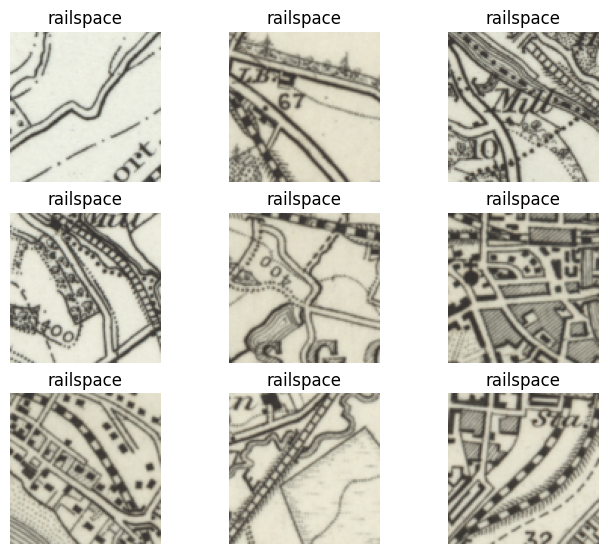

In [105]:
# show sample images for target label (tar_label)
annotated_images.show_sample(label_to_show="railspace")

## Prepare datasets and dataloaders

In [108]:
annotated_images.create_datasets(frac_train=0.7, frac_val=0.2, frac_test=0.1, context_datasets=True, context_df= "./patch_df.csv")

[INFO] Number of annotations in each set:
    - train:   168
    - val:   48
    - test:   25


In [109]:
annotated_images.datasets["train"].patch_df.head()

,parent_id,image_path,shape,pixel_bounds,coordinates,crs,polygon,mean_pixel_R,mean_pixel_G,mean_pixel_B,...,std_pixel_G,std_pixel_B,std_pixel_A,url,label,min_x,min_y,max_x,max_y,label_index
image_id,,,,,,,,,,,,,,,,,,,,,
patch-4900-2300-5000-2400-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(100, 100, 4)","(4900, 2300, 5000, 2400)","(-4.413414001464844, 55.94435448256653, -4.404...",EPSG:4326,POLYGON ((-4.4048309326171875 55.9443544825665...,0.881885,0.870016,0.796171,...,0.086277,0.081270,0.0,https://maps.nls.uk/view/74488689,no,4900,2300,5000,2400,0
patch-2500-1000-2600-1100-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(100, 100, 4)","(2500, 1000, 2600, 1100)","(-4.619407653808594, 56.00687093902572, -4.610...",EPSG:4326,POLYGON ((-4.6108245849609375 56.0068709390257...,0.750278,0.737364,0.670668,...,0.171260,0.159617,0.0,https://maps.nls.uk/view/74488689,no,2500,1000,2600,1100,0
patch-1000-3500-1100-3600-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(100, 100, 4)","(1000, 3500, 1100, 3600)","(-4.7481536865234375, 55.88664698429652, -4.73...",EPSG:4326,POLYGON ((-4.739570617675781 55.88664698429652...,0.863036,0.850319,0.778119,...,0.102524,0.096148,0.0,https://maps.nls.uk/view/74488689,no,1000,3500,1100,3600,0
patch-3300-5300-3400-5400-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(100, 100, 4)","(3300, 5300, 3400, 5400)","(-4.550743103027344, 55.800085736891496, -4.54...",EPSG:4326,POLYGON ((-4.5421600341796875 55.8000857368914...,0.760823,0.749264,0.684522,...,0.143623,0.133239,0.0,https://maps.nls.uk/view/74488689,no,3300,5300,3400,5400,0
patch-5200-3700-5300-3800-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(100, 100, 4)","(5200, 3700, 5300, 3800)","(-4.387664794921875, 55.87702906791819, -4.379...",EPSG:4326,POLYGON ((-4.379081726074219 55.87702906791819...,0.589005,0.577531,0.519250,...,0.169555,0.154990,0.0,https://maps.nls.uk/view/74488689,no,5200,3700,5300,3800,0


In [110]:
annotated_images.labels_map

{0: 'no', 1: 'railspace'}

In [111]:
dataloaders = annotated_images.create_dataloaders(batch_size=8)

[INFO] Using default sampler.


## Set up `ClassifierContainer`

### Load a pretrained PyTorch model, dataloaders and labels map

In [112]:
from mapreader import ClassifierContainer

In [113]:
my_classifier = ClassifierContainer(model ="resnet18",
                                    labels_map={0: 'No', 1: 'railspace'},
                                    dataloaders=dataloaders,
                                    )

[INFO] Device is set to cpu
[INFO] Initializing model.
[INFO] Loaded "train" with 168 items.
[INFO] Loaded "val" with 48 items.
[INFO] Loaded "test" with 25 items.


In [114]:
my_classifier.labels_map

{0: 'No', 1: 'railspace'}

[INFO] dataset: train
        - items:        168
        - batch size:   8
        - batches:      21


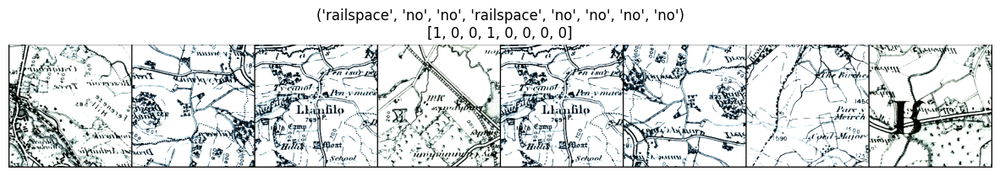

In [115]:
my_classifier.show_sample(set_name="train", batch_number=1)

In [116]:
my_classifier.model_summary()

Layer (type:depth-idx)                   Output Shape              Output Shape              Param #
ResNet                                   [8, 2]                    [8, 2]                    --
├─Conv2d: 1-1                            [8, 64, 112, 112]         [8, 64, 112, 112]         9,408
├─BatchNorm2d: 1-2                       [8, 64, 112, 112]         [8, 64, 112, 112]         128
├─ReLU: 1-3                              [8, 64, 112, 112]         [8, 64, 112, 112]         --
├─MaxPool2d: 1-4                         [8, 64, 56, 56]           [8, 64, 56, 56]           --
├─Sequential: 1-5                        [8, 64, 56, 56]           [8, 64, 56, 56]           --
│    └─BasicBlock: 2-1                   [8, 64, 56, 56]           [8, 64, 56, 56]           --
│    │    └─Conv2d: 3-1                  [8, 64, 56, 56]           [8, 64, 56, 56]           36,864
│    │    └─BatchNorm2d: 3-2             [8, 64, 56, 56]           [8, 64, 56, 56]           128
│    │    └─ReLU: 3-3     

### Set up criterion, optimizer and scheduler

In [117]:
my_classifier.add_criterion("cross-entropy")

[INFO] Using "CrossEntropyLoss()" as criterion.


In [118]:
params_to_optimize = my_classifier.generate_layerwise_lrs(
    min_lr=1e-4, max_lr=1e-3, spacing="geomspace"
)

In [119]:
my_classifier.initialize_optimizer(params2optimize=params_to_optimize)

In [120]:
my_classifier.initialize_scheduler()

## Train/fine-tune model

**Note:** it is possible to interrupt a training (using Kernel/Interrupt in Jupyter Notebook or ctrl+C). 

In [121]:
my_classifier.train(
    num_epochs=30,
    save_model_dir="./models_tutorial",
    tensorboard_path="tboard_tutorial",
    tmp_file_save_freq=5,
    remove_after_load=False,
    print_info_batch_freq=10,
)

[INFO] Each step will pass: ['train', 'val'].
2024-02-20 15:20:56 599-JY5FK6 [INFO] train    -- 1/30 --      8/168 (  4.8% ) -- Loss: 0.547
2024-02-20 15:21:02 599-JY5FK6 [INFO] train    -- 1/30 --     88/168 ( 52.4% ) -- Loss: 0.110
2024-02-20 15:21:08 599-JY5FK6 [INFO] train    -- 1/30 --    168/168 (100.0% ) -- Loss: 1.544
2024-02-20 15:21:08 599-JY5FK6 [INFO] train    -- 1/30 -- Loss: 0.901; F_macro: 69.51; R_macro: 69.53
2024-02-20 15:21:09 599-JY5FK6 [INFO] val      -- 1/30 --       8/48 ( 16.7% ) -- Loss: 10.904
2024-02-20 15:21:11 599-JY5FK6 [INFO] val      -- 1/30 -- Loss: 10.534; F_macro: 24.87; R_macro: 56.10

2024-02-20 15:21:12 599-JY5FK6 [INFO] train    -- 2/30 --      8/168 (  4.8% ) -- Loss: 0.314
2024-02-20 15:21:18 599-JY5FK6 [INFO] train    -- 2/30 --     88/168 ( 52.4% ) -- Loss: 0.576
2024-02-20 15:21:24 599-JY5FK6 [INFO] train    -- 2/30 --    168/168 (100.0% ) -- Loss: 0.154
2024-02-20 15:21:24 599-JY5FK6 [INFO] train    -- 2/30 -- Loss: 0.489; F_macro: 76.11; R_

In [122]:
list(my_classifier.metrics.keys())

['epoch_loss_train',
 'epoch_prec_micro_train',
 'epoch_recall_micro_train',
 'epoch_fscore_micro_train',
 'epoch_supp_micro_train',
 'epoch_rocauc_micro_train',
 'epoch_prec_macro_train',
 'epoch_recall_macro_train',
 'epoch_fscore_macro_train',
 'epoch_supp_macro_train',
 'epoch_rocauc_macro_train',
 'epoch_prec_weighted_train',
 'epoch_recall_weighted_train',
 'epoch_fscore_weighted_train',
 'epoch_supp_weighted_train',
 'epoch_rocauc_weighted_train',
 'epoch_prec_0_train',
 'epoch_recall_0_train',
 'epoch_fscore_0_train',
 'epoch_supp_0_train',
 'epoch_prec_1_train',
 'epoch_recall_1_train',
 'epoch_fscore_1_train',
 'epoch_supp_1_train',
 'epoch_loss_val',
 'epoch_prec_micro_val',
 'epoch_recall_micro_val',
 'epoch_fscore_micro_val',
 'epoch_supp_micro_val',
 'epoch_rocauc_micro_val',
 'epoch_prec_macro_val',
 'epoch_recall_macro_val',
 'epoch_fscore_macro_val',
 'epoch_supp_macro_val',
 'epoch_rocauc_macro_val',
 'epoch_prec_weighted_val',
 'epoch_recall_weighted_val',
 'epoch_fs

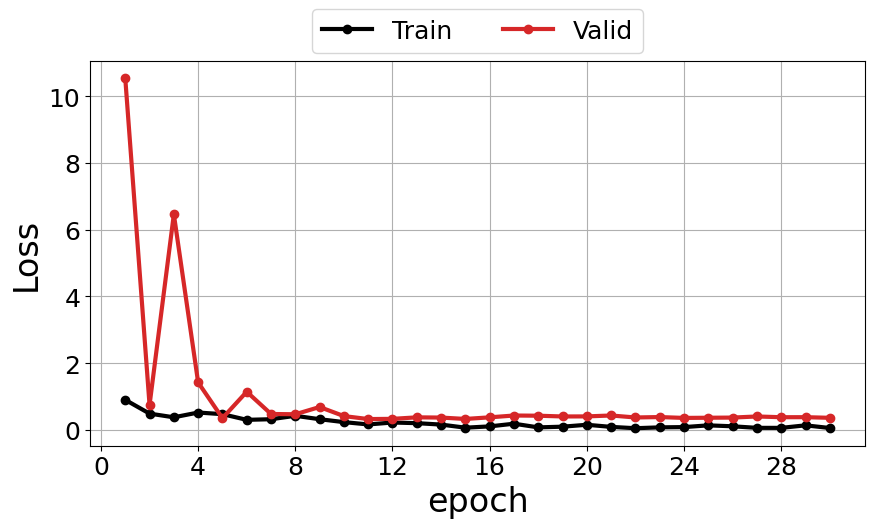

In [123]:
my_classifier.plot_metric(
    y_axis=["epoch_loss_train", "epoch_loss_val"],
    y_label="Loss",
    legends=["Train", "Valid"],
)

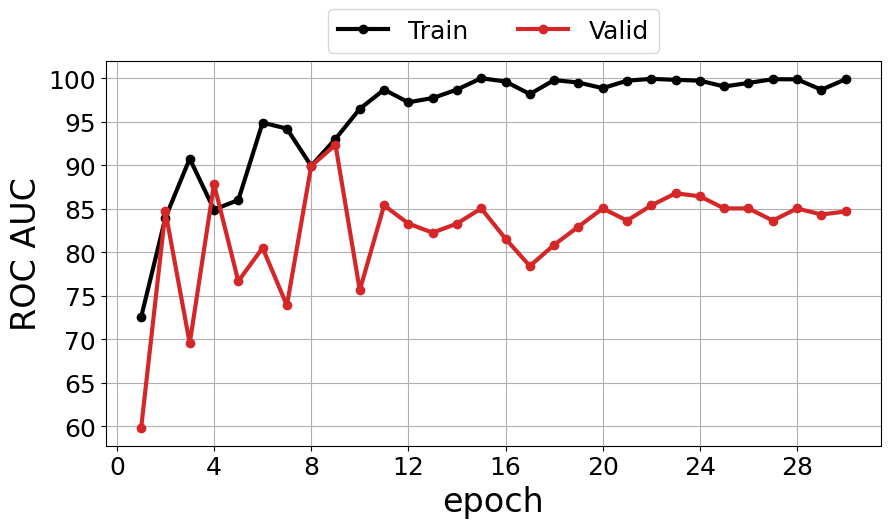

In [124]:
my_classifier.plot_metric(
    y_axis=["epoch_rocauc_macro_train", "epoch_rocauc_macro_val"],
    y_label="ROC AUC",
    legends=["Train", "Valid"],
    colors=["k", "tab:red"],
)

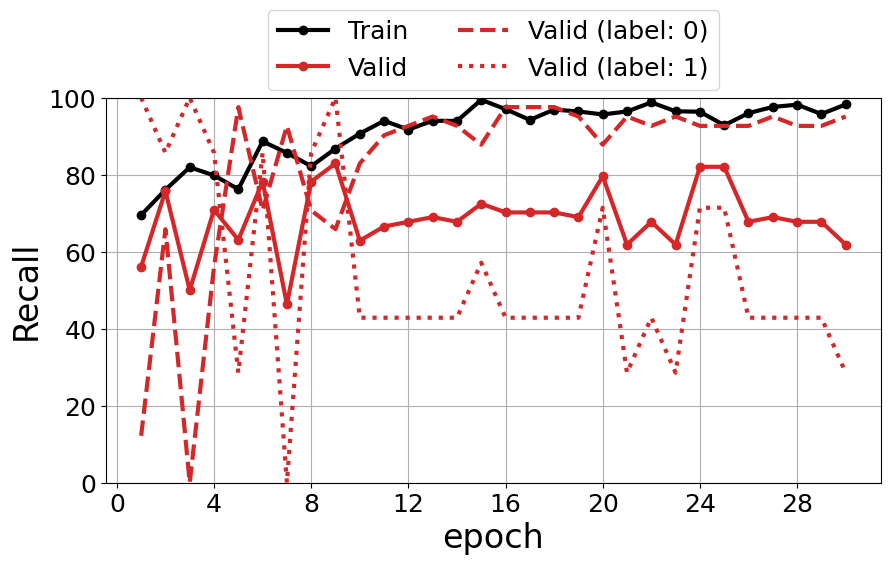

In [125]:
my_classifier.plot_metric(
    y_axis=[
        "epoch_recall_macro_train",
        "epoch_recall_macro_val",
        "epoch_recall_0_val",
        "epoch_recall_1_val",
    ],
    y_label="Recall",
    legends=[
        "Train",
        "Valid",
        "Valid (label: 0)",
        "Valid (label: 1)",
    ],
    colors=["k", "tab:red", "tab:red", "tab:red"],
    styles=["-", "-", "--", ":"],
    markers=["o", "o", "", ""],
    plt_yrange=[0, 100],
)

# Model inference

Here, we show how to load an already trained/fine-tuned model and a dataset and then do model inference.

## Load patches and add metadata

In [126]:
from mapreader import load_patches

In [127]:
my_maps = load_patches(
    "./patches_100_pixel/*74488689*png", parent_paths="./maps/map_74488689.png"
)

my_maps.add_metadata("./maps/metadata.csv", ignore_mismatch=True)
my_maps.add_metadata("patch_df.csv", tree_level="patch", ignore_mismatch=True)

0it [00:00, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/4275 [00:00<?, ?it/s]

In [128]:
parent_df, patch_df = my_maps.convert_images()

## Create dataset from patches

In [129]:
from mapreader import PatchContextDataset

In [130]:
patch_dataset = PatchContextDataset(patch_df, total_df=patch_df, transform="val", create_context=True)

In [131]:
my_classifier.load_dataset(
    patch_dataset, set_name="patches", batch_size=8, shuffle=False
)

In [132]:
my_classifier.print_batch_info(set_name="patches")

[INFO] dataset: patches
        - items:        4275
        - batch size:   8
        - batches:      535



## Inference

In [133]:
my_classifier.inference(set_name="patches")

[INFO] Each step will pass: ['patches'].
2024-02-20 15:30:18 599-JY5FK6 [INFO] patches  -- 31/31 --     8/4275 (  0.2% ) -- 
2024-02-20 15:30:20 599-JY5FK6 [INFO] patches  -- 31/31 --    48/4275 (  1.1% ) -- 
2024-02-20 15:30:22 599-JY5FK6 [INFO] patches  -- 31/31 --    88/4275 (  2.1% ) -- 
2024-02-20 15:30:24 599-JY5FK6 [INFO] patches  -- 31/31 --   128/4275 (  3.0% ) -- 
2024-02-20 15:30:26 599-JY5FK6 [INFO] patches  -- 31/31 --   168/4275 (  3.9% ) -- 
2024-02-20 15:30:29 599-JY5FK6 [INFO] patches  -- 31/31 --   208/4275 (  4.9% ) -- 
2024-02-20 15:30:31 599-JY5FK6 [INFO] patches  -- 31/31 --   248/4275 (  5.8% ) -- 
2024-02-20 15:30:34 599-JY5FK6 [INFO] patches  -- 31/31 --   288/4275 (  6.7% ) -- 
2024-02-20 15:30:36 599-JY5FK6 [INFO] patches  -- 31/31 --   328/4275 (  7.7% ) -- 
2024-02-20 15:30:38 599-JY5FK6 [INFO] patches  -- 31/31 --   368/4275 (  8.6% ) -- 
2024-02-20 15:30:40 599-JY5FK6 [INFO] patches  -- 31/31 --   408/4275 (  9.5% ) -- 
2024-02-20 15:30:41 599-JY5FK6 [INF

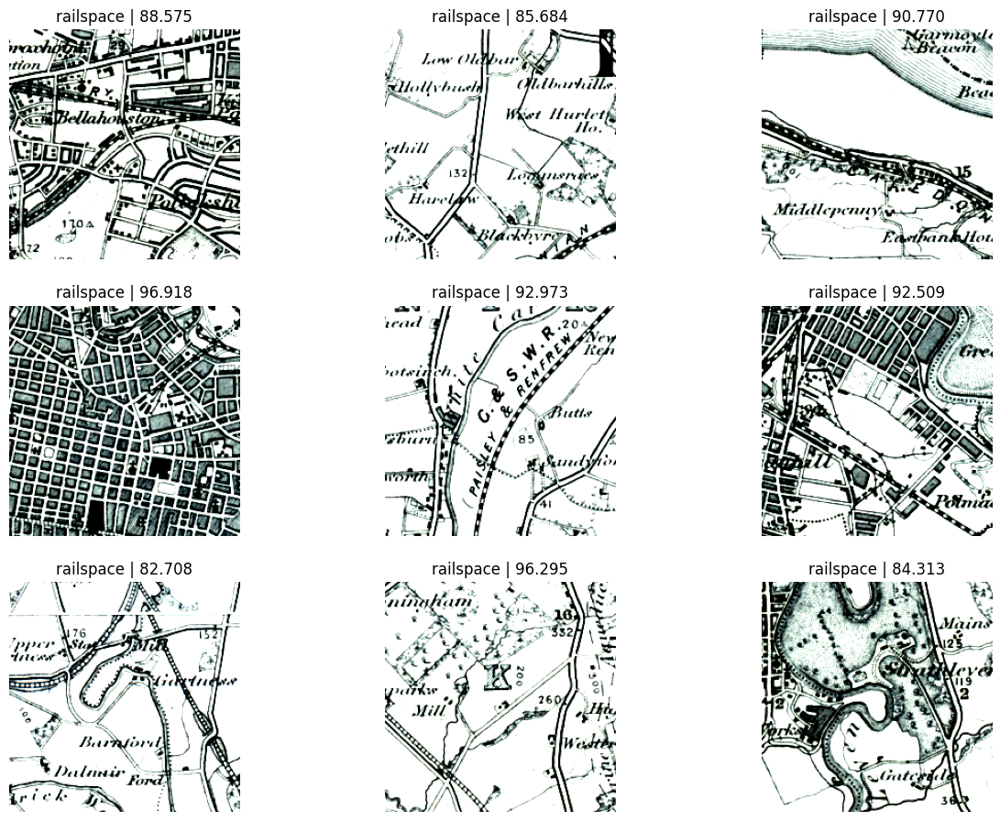

In [134]:
my_classifier.show_inference_sample_results(
    label="railspace", num_samples=9, set_name="patches", min_conf=80
)

## Add predictions to dataframe

In [135]:
my_classifier.save_predictions("patches")

[INFO] Saved predictions to patches_predictions_patch_df.csv.


## Add outputs to `MapImages` as metadata

In [136]:
my_maps.add_metadata("./patches_predictions_patch_df.csv", tree_level="patch")

In [137]:
my_maps.add_shape()

[INFO] Add shape, tree level: parent


In [138]:
parent_df, patch_df = my_maps.convert_images()
parent_df.head()

,parent_id,image_path,patches,name,url,coordinates,crs,published_date,grid_bb,shape
image_id,,,,,,,,,,
map_74488689.png,None,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,[patch-4800-4700-4900-4800-#map_74488689.png#....,map_74488689.png,https://maps.nls.uk/view/74488689,"(-4.833984375, 55.78892895389263, -4.196777343...",EPSG:4326,1898,"[(14, 7972, 5097)x(14, 8000, 5118)]","(5632, 7424, 4)"


  0%|          | 0/1 [00:00<?, ?it/s]

[<Figure size 2000x2000 with 2 Axes>]

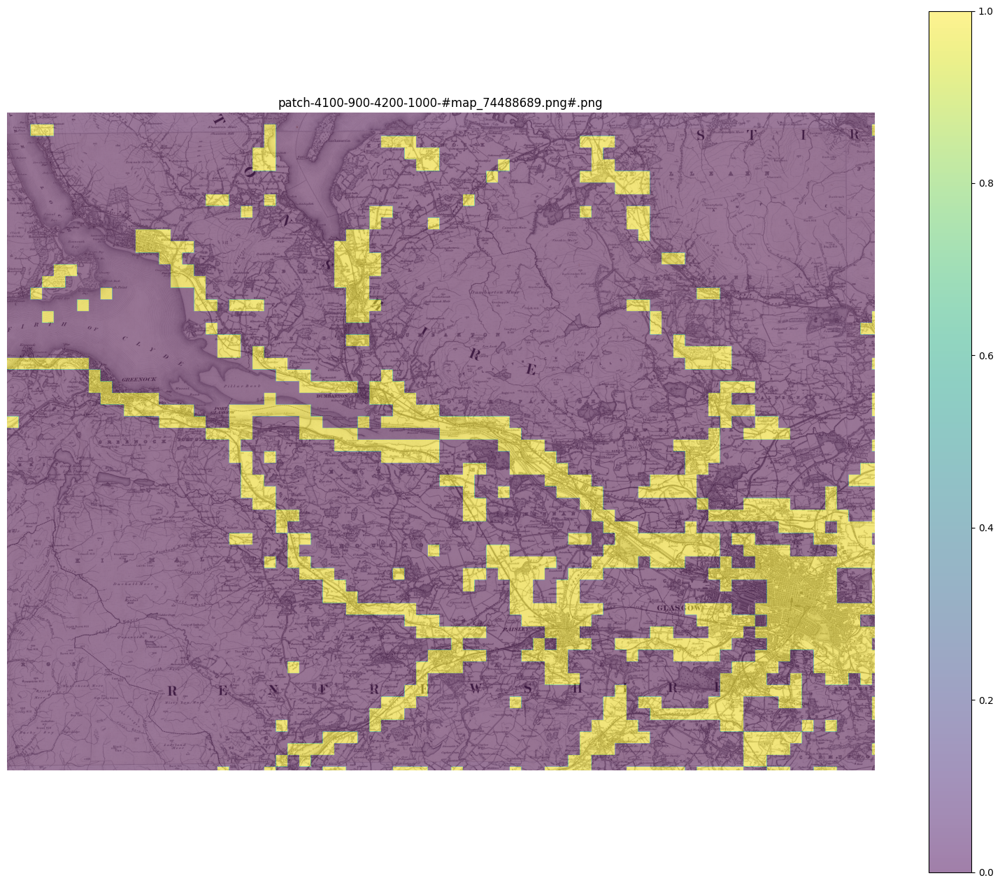

In [139]:
parent_list = my_maps.list_parents()

my_maps.show_parent(
    parent_list[0],
    column_to_plot="pred",
    patch_border=False,
    plot_parent=True,
    figsize=(20,20),
    alpha=0.5,
)

  0%|          | 0/1 [00:00<?, ?it/s]

[<Figure size 2000x2000 with 2 Axes>]

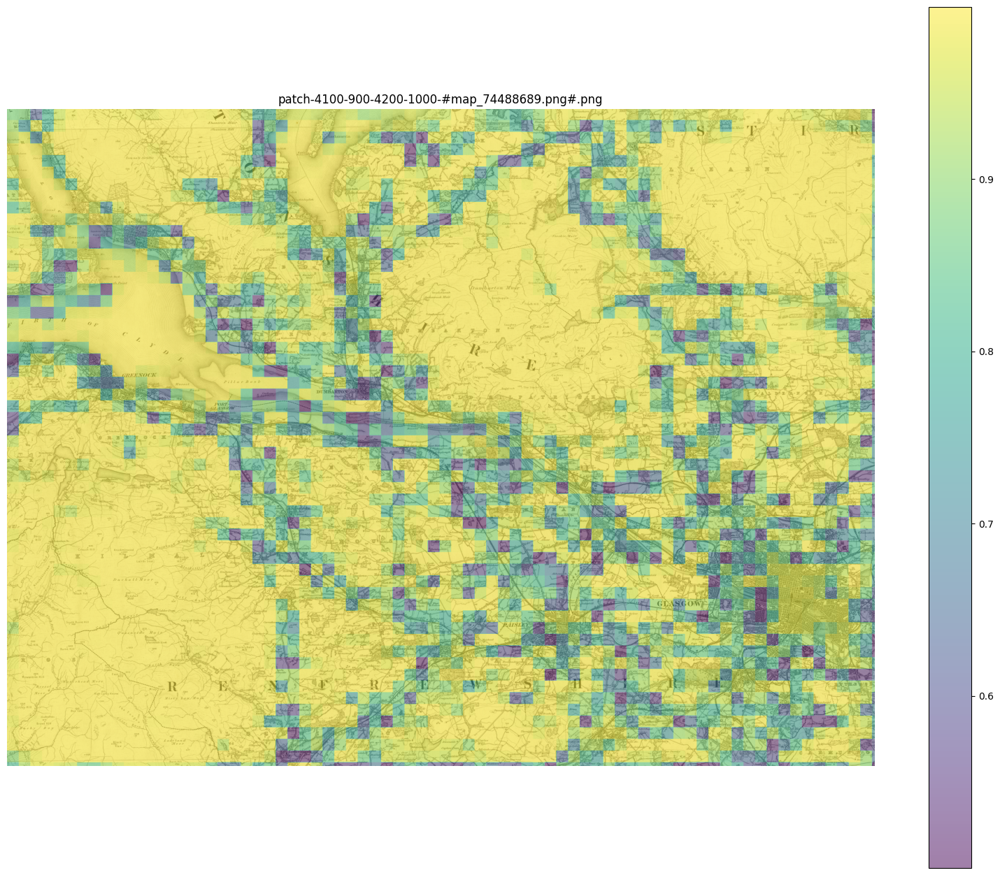

In [140]:
parent_list = my_maps.list_parents()

my_maps.show_parent(
    parent_list[0],
    column_to_plot="conf",
    patch_border=False,
    plot_parent=True,
    figsize=(20,20),
    alpha=0.5,
)